In [1]:
import warnings
warnings.filterwarnings(action='ignore')
%config Computer.use_jedi = False
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import missingno as msno
plt.rc('font', family='D2Coding')
from plotnine import *

In [2]:
shop = pd.read_csv('./data/shop_2022_seoul.csv')
shop.head()

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
0,MA0101202210A0037544,영자's곱창,NaN,I2,음식,I201,한식,I20109,곱창 전골/구이,I56111,...,1121510100101690021003140,NaN,서울특별시 광진구 면목로 172,143900,4904,NaN,1,NaN,127.082832,37.568503
1,MA0101202210A0097916,호텔클로이,NaN,I1,숙박,I101,일반 숙박,I10102,여관/모텔,I55102,...,1114014500101300000014092,유성장,서울특별시 중구 을지로42길 11,100411,4561,NaN,NaN,NaN,127.005849,37.565708
2,MA0101202210A0096343,나라차중계태권도장,NaN,P1,교육,P106,기타 교육,P10601,태권도/무술학원,P85611,...,1135010600103640019010971,삼부프라자,서울특별시 노원구 한글비석로 242,139861,1734,NaN,NaN,NaN,127.076956,37.649226
3,MA0101202210A0093845,이상한스냅,NaN,M1,과학·기술,M113,사진 촬영,M11301,사진촬영업,M73303,...,1147010300100090004000001,백송주택,서울특별시 양천구 월정로 283,158822,7902,NaN,NaN,NaN,126.828832,37.542117
4,MA010120220805430767,토끼정,NaN,I2,음식,I201,한식,I20101,백반/한정식,I56111,...,1150010500107740012000001,마커스빌딩,서울특별시 강서구 마곡동로 55,157805,7802,NaN,2,NaN,126.833022,37.560053


In [23]:
house = pd.read_csv('./data/서울특별시_전월세가_2022.csv')
house.head()

,접수년도,자치구코드,자치구명,법정동코드,법정동명,지번구분코드,지번구분,본번,부번,층,...,보증금(만원),임대료(만원),건물명,건축년도,건물용도,계약기간,신규계약구분,갱신청구권사용,종전보증금,종전임대료
0,2022,11560,영등포구,12600,양평동2가,1.0,대지,1.0,3.0,6.0,...,16000,0,힘멜하임,2014.0,오피스텔,22.01~24.01,신규,NaN,0.0,NaN
1,2022,11560,영등포구,11800,도림동,NaN,NaN,NaN,NaN,NaN,...,300,30,NaN,1986.0,단독다가구,NaN,NaN,NaN,NaN,NaN
2,2022,11215,광진구,10700,화양동,1.0,대지,111.0,12.0,19.0,...,10000,135,NaN,2021.0,오피스텔,22.01~24.01,신규,NaN,0.0,0.0
3,2022,11620,관악구,10100,봉천동,NaN,NaN,NaN,NaN,NaN,...,4000,40,NaN,2019.0,단독다가구,22.02~23.02,신규,NaN,0.0,0.0
4,2022,11620,관악구,10100,봉천동,NaN,NaN,NaN,NaN,NaN,...,13000,0,NaN,2019.0,단독다가구,22.01~24.01,신규,NaN,0.0,NaN


In [3]:
shop.columns

Index(['상가업소번호', '상호명', '지점명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드',
       '상권업종중분류명', '상권업종소분류코드', '상권업종소분류명', '표준산업분류코드', '표준산업분류명', '시도코드',
       '시도명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '지번코드',
       '대지구분코드', '대지구분명', '지번본번지', '지번부번지', '지번주소', '도로명코드', '도로명', '건물본번지',
       '건물부번지', '건물관리번호', '건물명', '도로명주소', '구우편번호', '신우편번호', '동정보', '층정보',
       '호정보', '경도', '위도'],
      dtype='object')

In [4]:
shop.drop(['동정보' ,'호정보' , '층정보'] ,axis=1, inplace=True)
shop.columns

Index(['상가업소번호', '상호명', '지점명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드',
       '상권업종중분류명', '상권업종소분류코드', '상권업종소분류명', '표준산업분류코드', '표준산업분류명', '시도코드',
       '시도명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '지번코드',
       '대지구분코드', '대지구분명', '지번본번지', '지번부번지', '지번주소', '도로명코드', '도로명', '건물본번지',
       '건물부번지', '건물관리번호', '건물명', '도로명주소', '구우편번호', '신우편번호', '경도', '위도'],
      dtype='object')

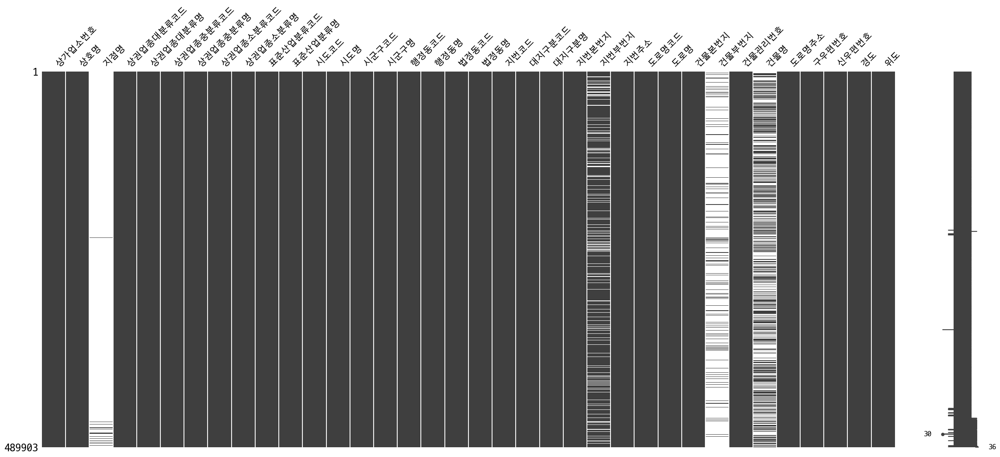

In [5]:
msno.matrix(shop , figsize=(30, 12))
plt.show()

In [6]:
value_columns = ['상호명', '지점명', '상권업종대분류명', '상권업종중분류명',  '상권업종소분류명',  '시도명','시군구명', '행정동명','법정동명', '지번주소', 
                 '도로명주소',  '경도', '위도']
shop_col = shop[value_columns]
shop_col

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도
0,영자's곱창,NaN,음식,한식,곱창 전골/구이,서울특별시,광진구,중곡3동,중곡동,서울특별시 광진구 중곡동 169-21,서울특별시 광진구 면목로 172,127.082832,37.568503
1,호텔클로이,NaN,숙박,일반 숙박,여관/모텔,서울특별시,중구,광희동,광희동1가,서울특별시 중구 광희동1가 130,서울특별시 중구 을지로42길 11,127.005849,37.565708
2,나라차중계태권도장,NaN,교육,기타 교육,태권도/무술학원,서울특별시,노원구,중계본동,중계동,서울특별시 노원구 중계동 364-19,서울특별시 노원구 한글비석로 242,127.076956,37.649226
3,이상한스냅,NaN,과학·기술,사진 촬영,사진촬영업,서울특별시,양천구,신월5동,신월동,서울특별시 양천구 신월동 9-4,서울특별시 양천구 월정로 283,126.828832,37.542117
4,토끼정,NaN,음식,한식,백반/한정식,서울특별시,강서구,가양1동,마곡동,서울특별시 강서구 마곡동 774-12,서울특별시 강서구 마곡동로 55,126.833022,37.560053
...,...,...,...,...,...,...,...,...,...,...,...,...,...
489898,저스트원,NaN,과학·기술,시장 조사,시장 조사 및 여론 조사업,서울특별시,송파구,문정2동,문정동,서울특별시 송파구 문정동 651-14,서울특별시 송파구 법원로6길 7,127.121763,37.483514
489899,연리폼수선,NaN,수리·개인,기타 가정용품 수리,의류/이불 수선업,서울특별시,송파구,석촌동,석촌동,서울특별시 송파구 석촌동 216-31,서울특별시 송파구 삼학사로8길 15,127.098631,37.500180
489900,아라리오,NaN,과학·기술,본사·경영 컨설팅,경영 컨설팅업,서울특별시,서초구,서초3동,서초동,서울특별시 서초구 서초동 1589-9,서울특별시 서초구 반포대로12길 37,127.013291,37.485388
489901,출장마사지,NaN,수리·개인,욕탕·신체관리,체형/비만 관리,서울특별시,강남구,일원1동,일원동,서울특별시 강남구 일원동 684,서울특별시 강남구 일원로 35,127.081173,37.490630


In [7]:
del shop

In [8]:
shop_col.isnull().sum()

상호명              0
지점명         483821
상권업종대분류명         0
상권업종중분류명         0
상권업종소분류명         0
시도명              0
시군구명             0
행정동명             0
법정동명             0
지번주소             0
도로명주소            0
경도               0
위도               0
dtype: int64

# 데이터프레임에서 서울 데이터만 추출한다.

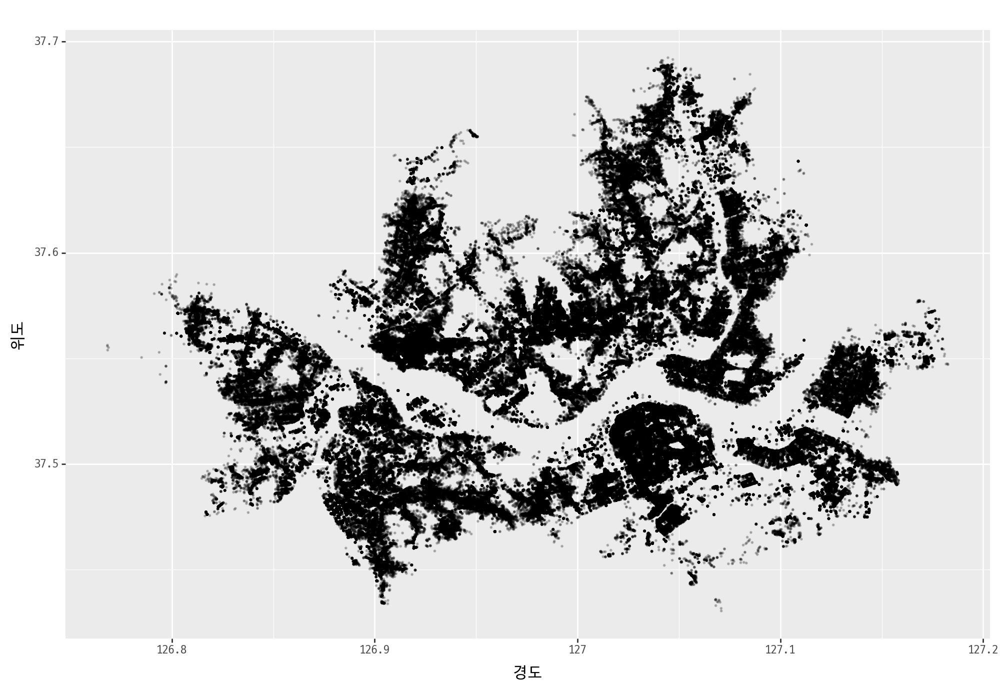

<Figure Size: (1000 x 700)>

In [9]:
# 서울만 시각화해보면 서울 지도하고 비슷하게 나온다. 
(
    ggplot(shop_col, aes(x='경도', y='위도'))
        + geom_point(size=0.2, alpha=0.2)
        + theme(text=element_text(family='D2Coding') , figure_size=(10,7))
)

# 데이터프레임의 도로명주소 열을 활용해서 '시도', '구군', '도로명' 열을 만든다.

In [10]:
# split() 메소드에 expend=True 옵션을 지정해서 공백을 경계로 문자열을 서로 다른 열(데이터프레임)로 구분해서 '시도''구군''도로명 열을 만든다.
print(type(shop_col[:1].도로명주소.str)) #Series에는 split속성이 없다. - 스트링으로 형변환
print(type(shop_col[:1].도로명주소.str.split(' '))) # 다시 시리즈로 변환
print('-' * 80)
print(type(shop_col[:1].도로명주소.str.split(' ' , expand=True))) # 데이터프레임으로 속성 변환
print(shop_col[:1].도로명주소.str.split(' ' , expand=True)[0]) # 데이터프레임의 열 이름을 추가
print(shop_col[:1].도로명주소.str.split(' ' , expand=True)[1])
print(shop_col[:1].도로명주소.str.split(' ' , expand=True)[2])

<class 'pandas.core.strings.accessor.StringMethods'>
<class 'pandas.core.series.Series'>
--------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
0    서울특별시
Name: 0, dtype: object
0    광진구
Name: 1, dtype: object
0    면목로
Name: 2, dtype: object


In [11]:
shop_col['시도'] = shop_col.도로명주소.str.split(' ' , expand=True)[0]
shop_col['구군'] = shop_col.도로명주소.str.split(' ' , expand=True)[1]
shop_col['도로명'] = shop_col.도로명주소.str.split(' ' , expand=True)[2]
shop_col

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
0,영자's곱창,NaN,음식,한식,곱창 전골/구이,서울특별시,광진구,중곡3동,중곡동,서울특별시 광진구 중곡동 169-21,서울특별시 광진구 면목로 172,127.082832,37.568503,서울특별시,광진구,면목로
1,호텔클로이,NaN,숙박,일반 숙박,여관/모텔,서울특별시,중구,광희동,광희동1가,서울특별시 중구 광희동1가 130,서울특별시 중구 을지로42길 11,127.005849,37.565708,서울특별시,중구,을지로42길
2,나라차중계태권도장,NaN,교육,기타 교육,태권도/무술학원,서울특별시,노원구,중계본동,중계동,서울특별시 노원구 중계동 364-19,서울특별시 노원구 한글비석로 242,127.076956,37.649226,서울특별시,노원구,한글비석로
3,이상한스냅,NaN,과학·기술,사진 촬영,사진촬영업,서울특별시,양천구,신월5동,신월동,서울특별시 양천구 신월동 9-4,서울특별시 양천구 월정로 283,126.828832,37.542117,서울특별시,양천구,월정로
4,토끼정,NaN,음식,한식,백반/한정식,서울특별시,강서구,가양1동,마곡동,서울특별시 강서구 마곡동 774-12,서울특별시 강서구 마곡동로 55,126.833022,37.560053,서울특별시,강서구,마곡동로
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
489898,저스트원,NaN,과학·기술,시장 조사,시장 조사 및 여론 조사업,서울특별시,송파구,문정2동,문정동,서울특별시 송파구 문정동 651-14,서울특별시 송파구 법원로6길 7,127.121763,37.483514,서울특별시,송파구,법원로6길
489899,연리폼수선,NaN,수리·개인,기타 가정용품 수리,의류/이불 수선업,서울특별시,송파구,석촌동,석촌동,서울특별시 송파구 석촌동 216-31,서울특별시 송파구 삼학사로8길 15,127.098631,37.500180,서울특별시,송파구,삼학사로8길
489900,아라리오,NaN,과학·기술,본사·경영 컨설팅,경영 컨설팅업,서울특별시,서초구,서초3동,서초동,서울특별시 서초구 서초동 1589-9,서울특별시 서초구 반포대로12길 37,127.013291,37.485388,서울특별시,서초구,반포대로12길
489901,출장마사지,NaN,수리·개인,욕탕·신체관리,체형/비만 관리,서울특별시,강남구,일원1동,일원동,서울특별시 강남구 일원동 684,서울특별시 강남구 일원로 35,127.081173,37.490630,서울특별시,강남구,일원로


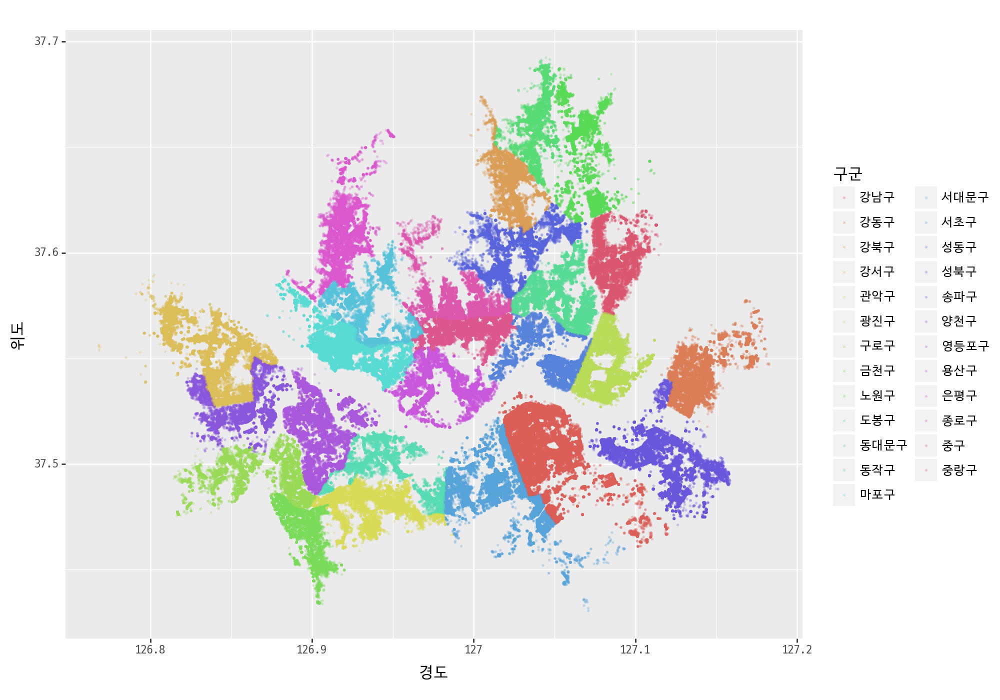

<Figure Size: (1000 x 700)>

In [12]:
(
    ggplot(shop_col, aes(x='경도', y='위도', color='구군'))
        + geom_point(size=0.2, alpha=0.2)
        + theme(text=element_text(family='D2Coding') , figure_size=(10,7))
)

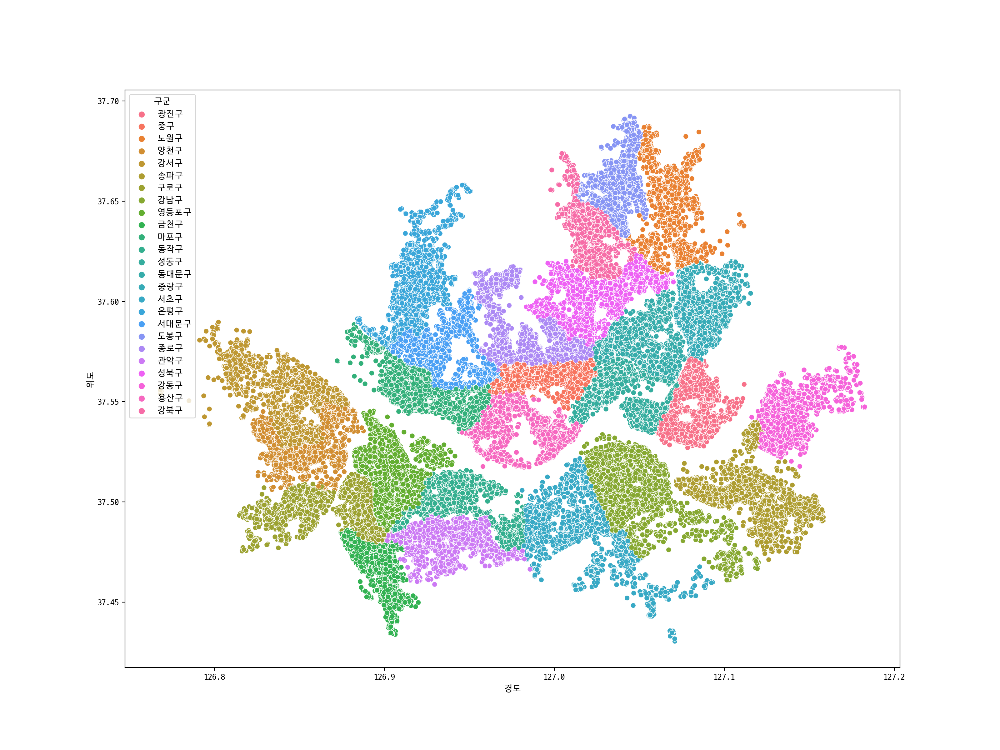

In [13]:
plt.figure(figsize=(16,12))
sns.scatterplot(data=shop_col, x = '경도', y = '위도', hue='구군')
plt.show()

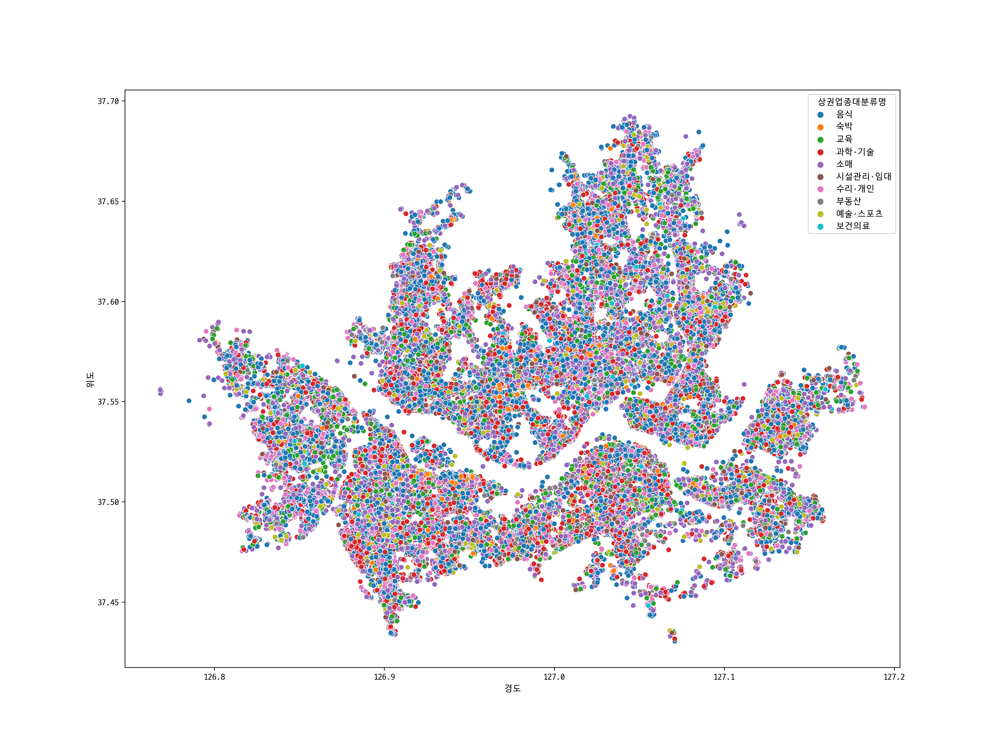

In [14]:
plt.figure(figsize=(16,12))
sns.scatterplot(data=shop_col, x = '경도', y = '위도', hue='상권업종대분류명')
plt.show()

In [18]:
shop_col = shop_col[shop_col.상권업종대분류명 == '교육']
shop_col

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
2,나라차중계태권도장,NaN,교육,기타 교육,태권도/무술학원,서울특별시,노원구,중계본동,중계동,서울특별시 노원구 중계동 364-19,서울특별시 노원구 한글비석로 242,127.076956,37.649226,서울특별시,노원구,한글비석로
11,볼벤,NaN,교육,기타 교육,기타 기술/직업 훈련학원,서울특별시,마포구,성산1동,성산동,서울특별시 마포구 성산동 214-20,서울특별시 마포구 월드컵로30다길 41,126.908665,37.562237,서울특별시,마포구,월드컵로30다길
29,엑스퍼트짐,NaN,교육,기타 교육,레크리에이션 교육기관,서울특별시,은평구,응암3동,응암동,서울특별시 은평구 응암동 119-1,서울특별시 은평구 응암로 269,126.918749,37.596001,서울특별시,은평구,응암로
42,율립연구소,NaN,교육,기타 교육,요가/필라테스 학원,서울특별시,송파구,위례동,장지동,서울특별시 송파구 장지동 881,서울특별시 송파구 위례광장로 188,127.142381,37.481079,서울특별시,송파구,위례광장로
73,춤연,NaN,교육,기타 교육,기타 예술/스포츠 교육기관,서울특별시,서초구,양재1동,양재동,서울특별시 서초구 양재동 89-4,서울특별시 서초구 양재천로29길 3,127.042226,37.479264,서울특별시,서초구,양재천로29길
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
489849,야드,NaN,교육,교육 지원,교육컨설팅업,서울특별시,성동구,성수1가1동,성수동1가,서울특별시 성동구 성수동1가 656-462,서울특별시 성동구 왕십리로 66-10,127.044962,37.543207,서울특별시,성동구,왕십리로
489854,한국직업개발원동부지사,NaN,교육,기타 교육,직원 훈련기관,서울특별시,성동구,성수1가2동,성수동1가,서울특별시 성동구 성수동1가 13-214,서울특별시 성동구 상원12길 30,127.050669,37.550029,서울특별시,성동구,상원12길
489863,클래시,NaN,교육,기타 교육,요가/필라테스 학원,서울특별시,송파구,잠실본동,잠실동,서울특별시 송파구 잠실동 183-12,서울특별시 송파구 백제고분로7길 41,127.083559,37.510985,서울특별시,송파구,백제고분로7길
489871,홍선생영어입시전문학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,노원구,중계본동,중계동,서울특별시 노원구 중계동 366-14,서울특별시 노원구 중계로18길 13,127.077803,37.651296,서울특별시,노원구,중계로18길


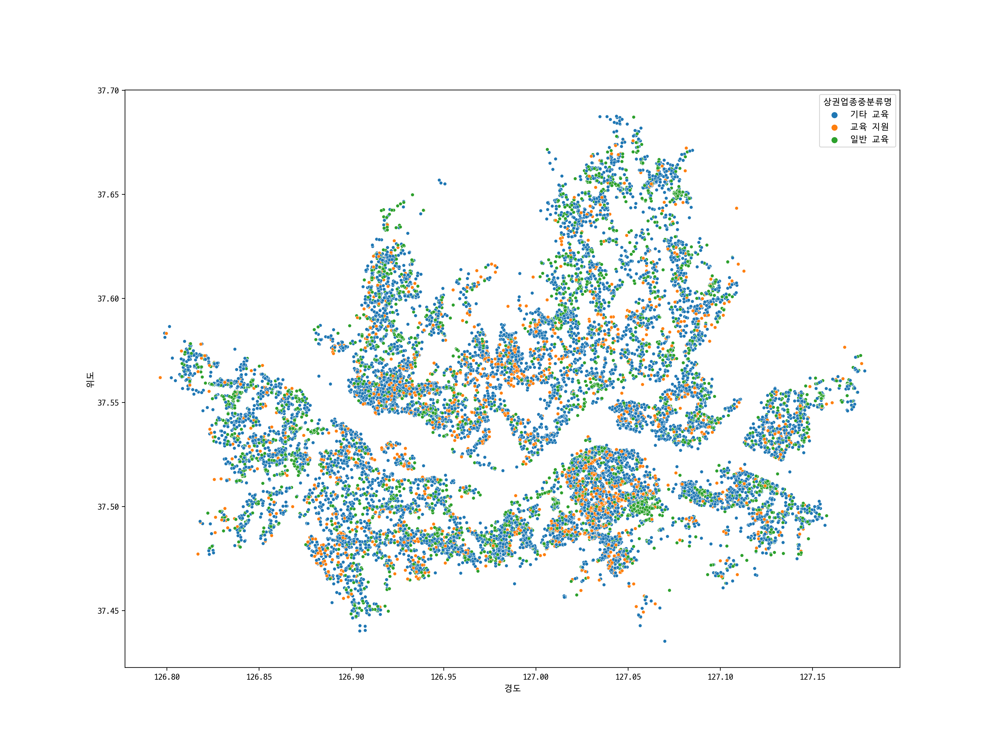

In [19]:
plt.figure(figsize=(16,12))
sns.scatterplot(data=shop_col, x = '경도', y = '위도', hue='상권업종중분류명', s=15)
plt.show()

# 입시 학원

In [20]:
shop_col_edu = shop_col[shop_col.상권업종소분류명 == '입시·교과학원']
shop_col_edu

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
135,메타인프렙입시컨설팅학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,서초구,서초3동,서초동,서울특별시 서초구 서초동 1542-5,서울특별시 서초구 서초대로42길 12,127.008519,37.491412,서울특별시,서초구,서초대로42길
175,지아이에스강남인터내셔널스쿨,NaN,교육,일반 교육,입시·교과학원,서울특별시,서초구,내곡동,내곡동,서울특별시 서초구 내곡동 1-1969,서울특별시 서초구 샘마을2길 33,127.072451,37.459799,서울특별시,서초구,샘마을2길
233,생수학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,강남구,대치2동,대치동,서울특별시 강남구 대치동 977-16,서울특별시 강남구 삼성로64길 51,127.064442,37.501095,서울특별시,강남구,삼성로64길
234,목동진학학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,구로구,개봉1동,개봉동,서울특별시 구로구 개봉동 476,서울특별시 구로구 경인로 382,126.863054,37.496382,서울특별시,구로구,경인로
236,니키앤로라영어학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 201-3,서울특별시 송파구 위례성대로16길 27,127.124084,37.510373,서울특별시,송파구,위례성대로16길
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
489672,학원현장결제_1,NaN,교육,일반 교육,입시·교과학원,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 역삼동 647-9,서울특별시 강남구 테헤란로 131,127.032924,37.500075,서울특별시,강남구,테헤란로
489704,에듀플렉스길음보습,NaN,교육,일반 교육,입시·교과학원,서울특별시,성북구,길음2동,길음동,서울특별시 성북구 길음동 1278,서울특별시 성북구 숭인로2길 61,127.024953,37.609343,서울특별시,성북구,숭인로2길
489842,가재울정이조주니어영어학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,서대문구,남가좌1동,남가좌동,서울특별시 서대문구 남가좌동 270-4,서울특별시 서대문구 수색로 48,126.913584,37.570391,서울특별시,서대문구,수색로
489871,홍선생영어입시전문학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,노원구,중계본동,중계동,서울특별시 노원구 중계동 366-14,서울특별시 노원구 중계로18길 13,127.077803,37.651296,서울특별시,노원구,중계로18길


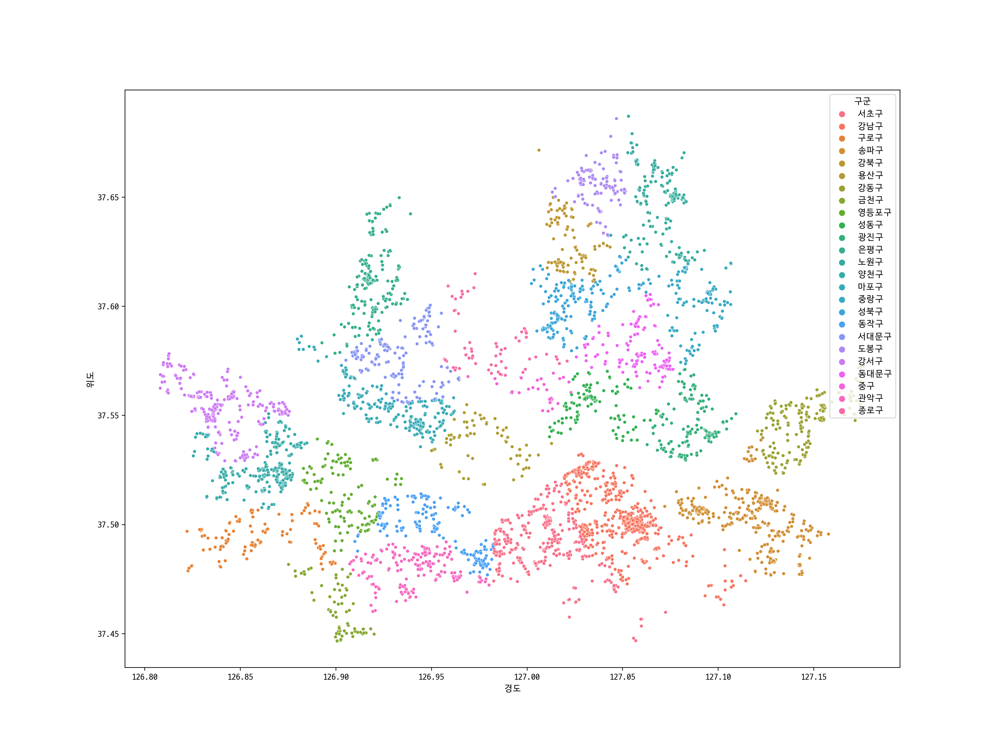

In [21]:
plt.figure(figsize=(16,12))
sns.scatterplot(data=shop_col_edu, x = '경도', y = '위도', hue='구군', s=15)
plt.show()